# 2023 Mw 6.1 Mariana Islands — can teleseismic data resolve a finite-fault model this small?
Event `us6000kzv3`: 2023-08-14T13:51:53.8Z, 13.347°N 147.530°E, origin depth 8 km (W-phase centroid 13.5 km), Mww 6.1 (M0 1.74e18 N·m, 91% DC). Oblique normal + strike-slip faulting east of Guam near the Mariana trench (outer-rise style): **NP1 253/56/−29**, NP2 0/66/−143. **USGS published no finite-fault product** (none is expected at M6.1) — so the question, posed directly, is whether a *reliable* FFM is resolvable at all from teleseismic data.

**The guiding precedent** (user-supplied): Hartzell, Mendoza & Zeng (2013, GRL) resolved the 2011 **Mw 5.8** Mineral, Virginia rupture from teleseismic P waves alone. Their enabling ingredients — P waves to ~1 Hz (t* ≈ 1 s still passes source detail), resolution carried by *timing* rather than amplitude, ~1-km subfaults, a compact fault — are all present here: WISP's body-wave filter runs 0.01–1.0 Hz and auto-sized 2.4 × 2.0 km subfaults.

Same protocol as nbs 24–28. Full write-up: `event_2023_mariana/report/report.pdf`.


In [1]:
import os
from IPython.display import Image, display
B = os.path.expanduser('~/works/17.Venezuela_2026')


## 1. Data
**205 three-component stations, 30–90°, max azimuthal gap 28°** — the densest coverage of any event in this project, which matters doubly for an oblique mechanism with a large strike-slip component (nb28's four-lobe aliasing lesson). MTUQ used a response-corrected azimuth-balanced 60-station subset; WISP applied its own QC.


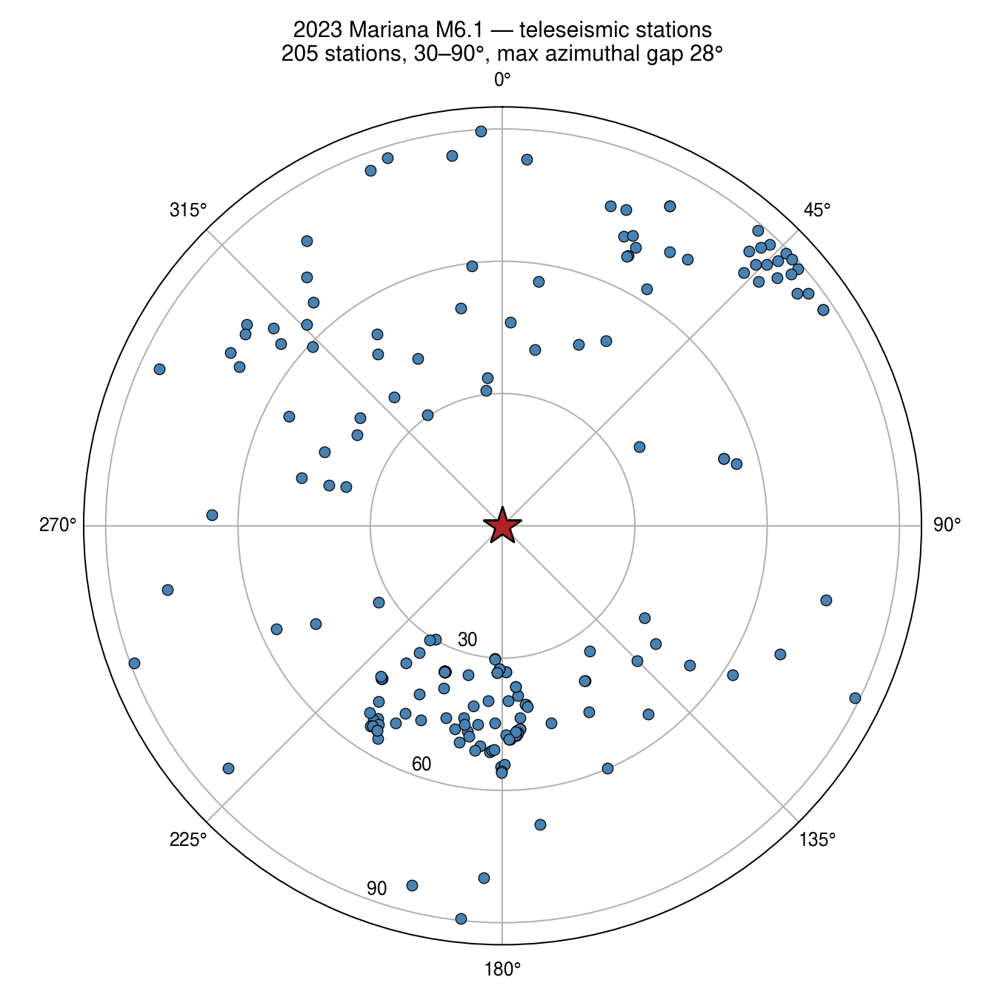

In [2]:
display(Image(os.path.join(B,'event_2023_mariana/fig_mariana_stations.png')))


## 2. Moment tensor (MTUQ) — the independent point source FAILS at M6.1
At M0 ~2×10¹⁸ N·m the standard teleseismic bands (body 10–33 s, surface 50–100 s) are low-SNR at 30–90°, and it shows:

| variant | mechanism | Mw | Kagan vs W-phase |
|---|---|---|---|
| DC joint, 60 stn | 68/82/−2 | 6.25 | 52.5° |
| DC body P+SH, 60 stn | 122/54/52 | 5.80 (**lower grid edge**) | 85.7° |
| depth scan 6–33 km | mechanism drifts | — | misfit varies **0.2%** |

Neither the mechanism nor the centroid depth is independently resolvable — the depth-misfit curve is flat to 0.2% over 6–33 km (middle panel of the resolution figure below). This is not an azimuth-coverage problem (gap 28°): it is a signal-to-noise floor. **Pipeline rule for M≲6.5: take the mechanism and depth from the W-phase (USGS's dedicated long-period processing) and spend the teleseismic data on the finite fault** — which is exactly the Hartzell strategy.


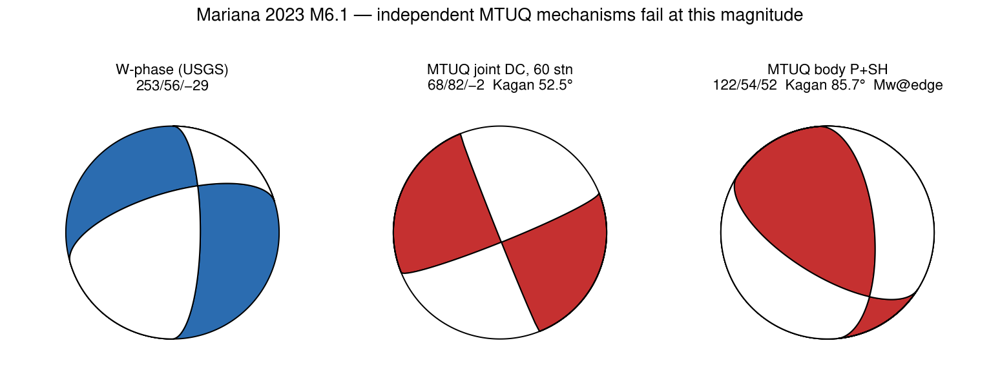

In [3]:
display(Image(os.path.join(B,'event_2023_mariana/fig_mariana_mtuq_beachballs.png')))


## 3. Finite fault (WISP) — both W-phase planes, Mww-seeded, shift_match applied

| plane | strike/dip/rake | misfit (post-shift) | peak slip | T5-95 |
|---|---|---|---|---|
| **NP1 (preferred)** | **253/56/−29** | **0.2012** | 24.9 cm | 8.2 s |
| NP2 | 0/66/−143 | 0.2058 | 24.9 cm | 7.9 s |

Recovered M0 = 1.76×10¹⁸ N·m vs the W-phase 1.74×10¹⁸ — 1% agreement. The NP1 preference (2.2%) sits between the Calama near-tie (1.6%) and the SPdA decisive margin (10%): **suggestive, not conclusive** for a ~10-km rupture, per the established rupture-size criterion.


### Preferred plane NP1 (253/56/−29) — slip, isochrones, moment rate, map, waveform fits


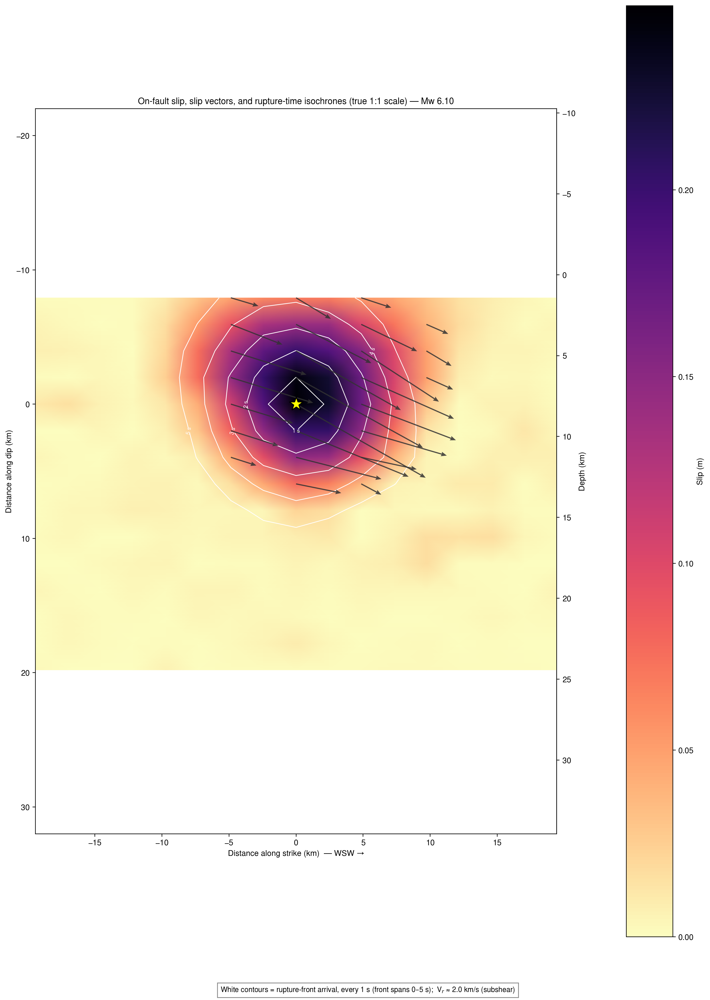

In [4]:
display(Image(os.path.join(B,'event_2023_mariana/20230814135153/ffm.0/NP1_shift/plots/SlipIsochrone_trueScale.png')))


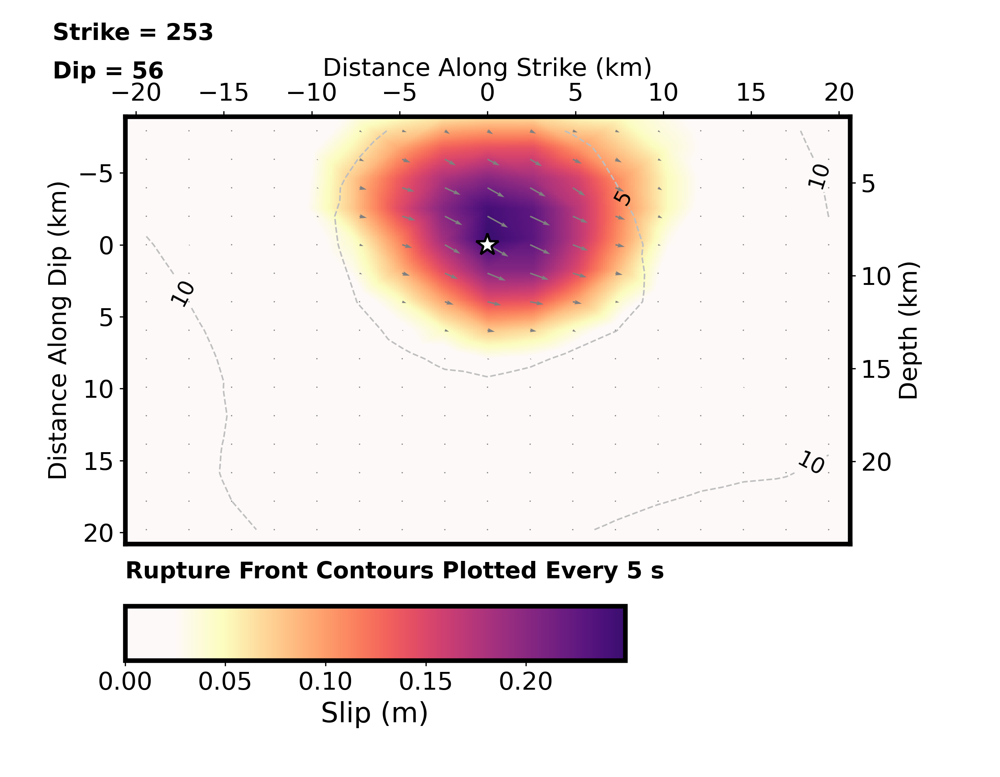

In [5]:
display(Image(os.path.join(B,'event_2023_mariana/20230814135153/ffm.0/NP1_shift/plots/SlipDist_plane0_5s.png')))


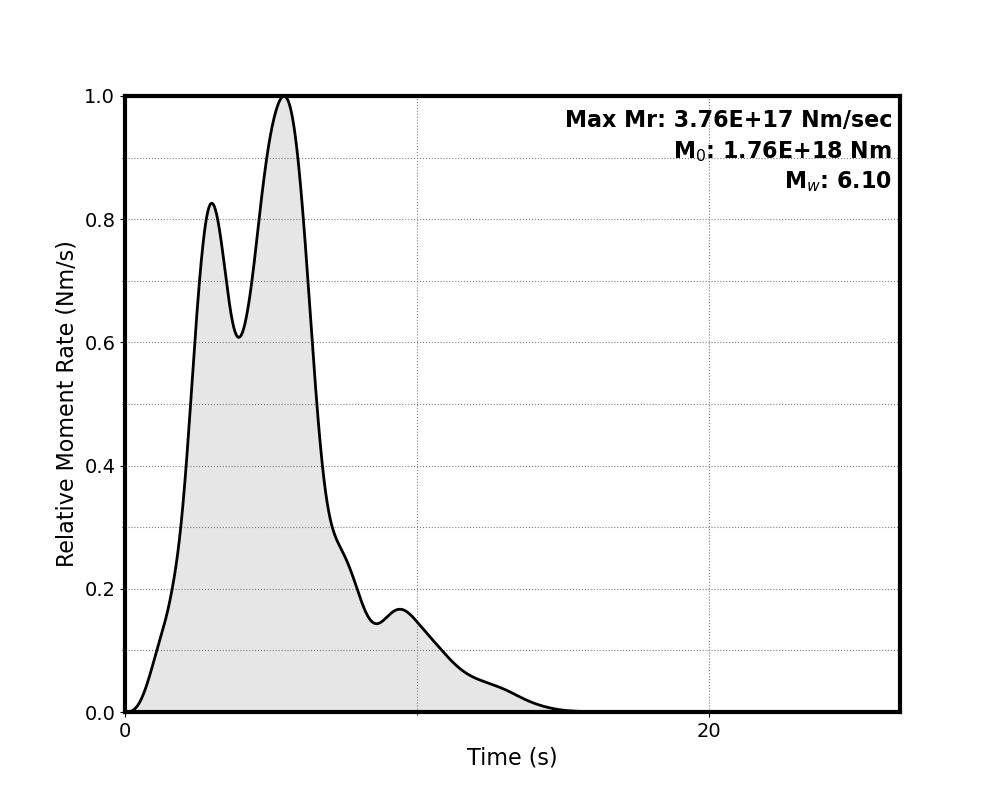

In [6]:
display(Image(os.path.join(B,'event_2023_mariana/20230814135153/ffm.0/NP1_shift/plots/MomentRate.png')))


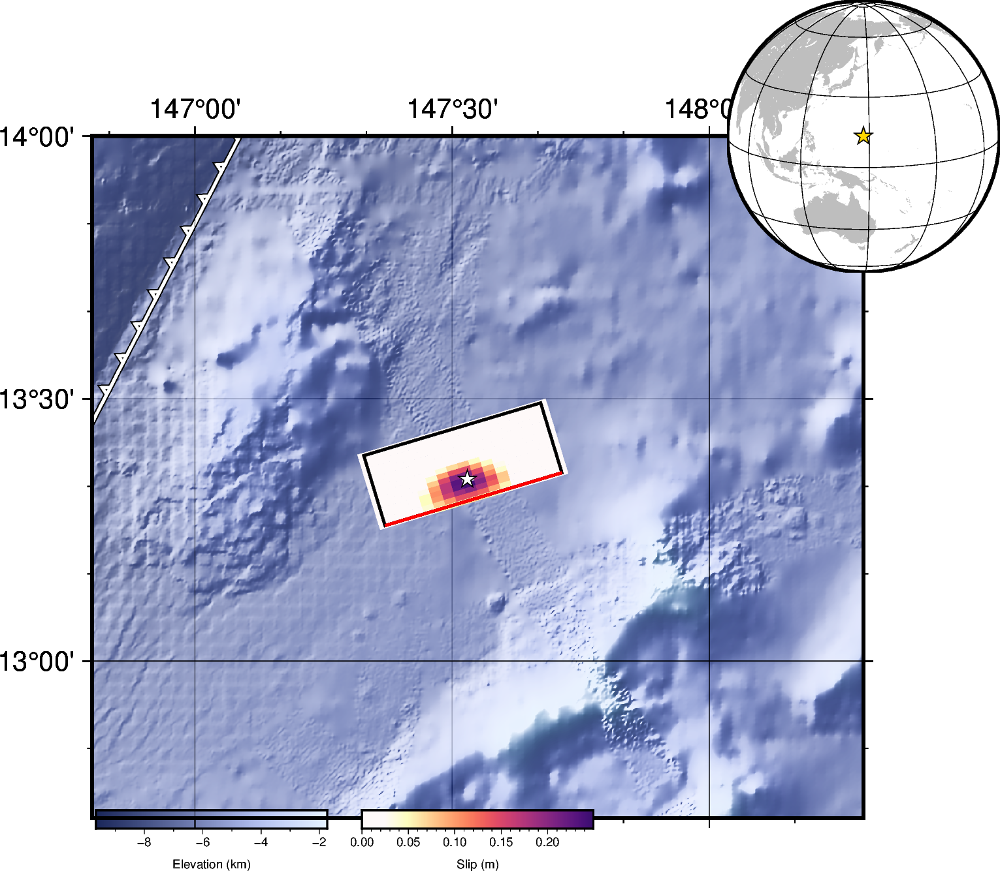

In [7]:
display(Image(os.path.join(B,'event_2023_mariana/20230814135153/ffm.0/NP1_shift/plots/Map.png')))


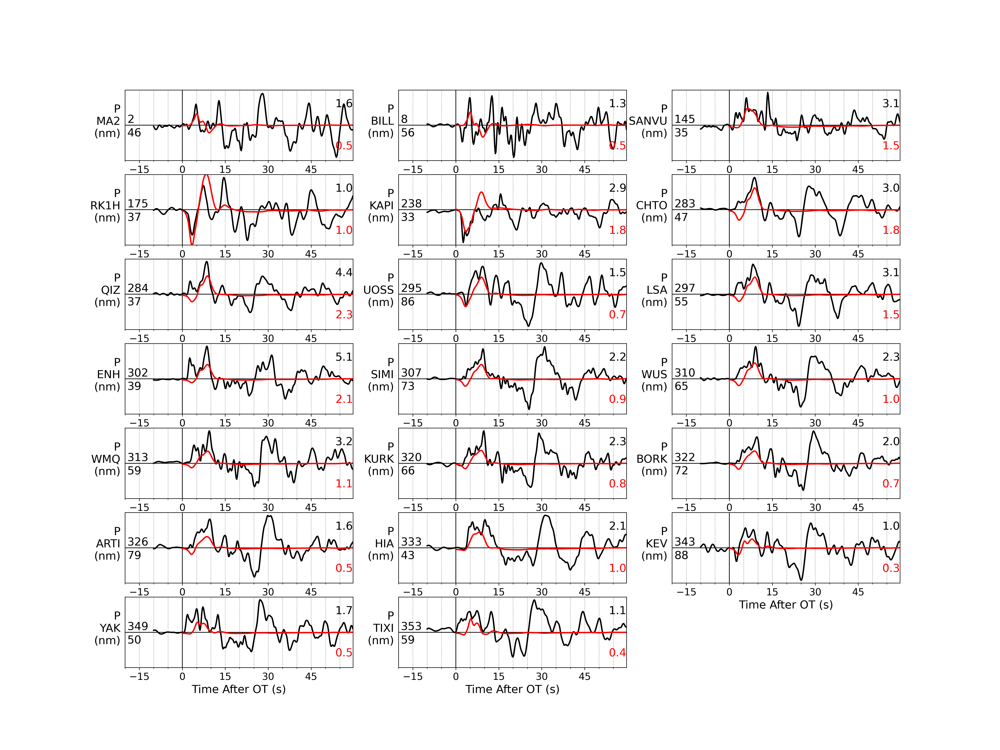

In [8]:
display(Image(os.path.join(B,'event_2023_mariana/20230814135153/ffm.0/NP1_shift/plots/P_body_waves.png')))


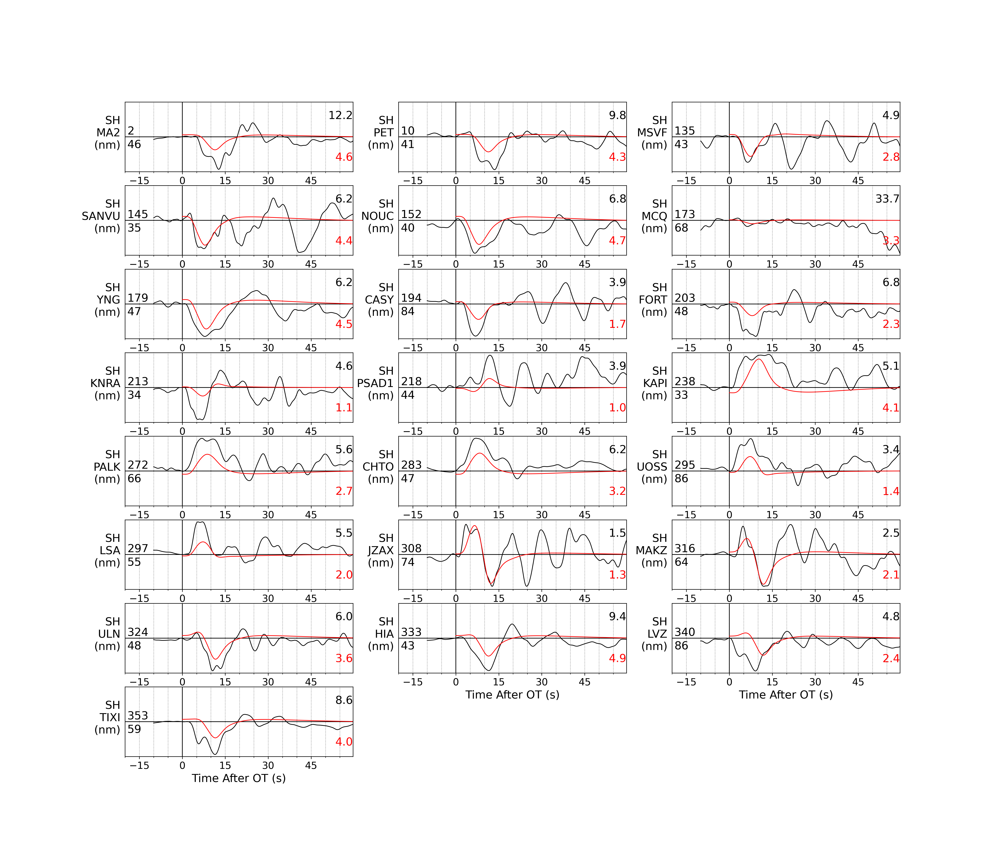

In [9]:
display(Image(os.path.join(B,'event_2023_mariana/20230814135153/ffm.0/NP1_shift/plots/SH_body_waves.png')))


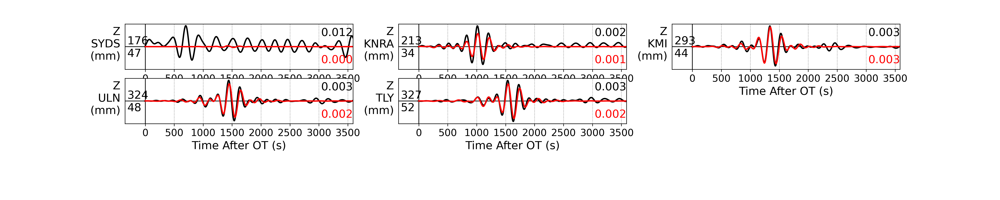

In [10]:
display(Image(os.path.join(B,'event_2023_mariana/20230814135153/ffm.0/NP1_shift/plots/Rayleigh_surf_waves.png')))


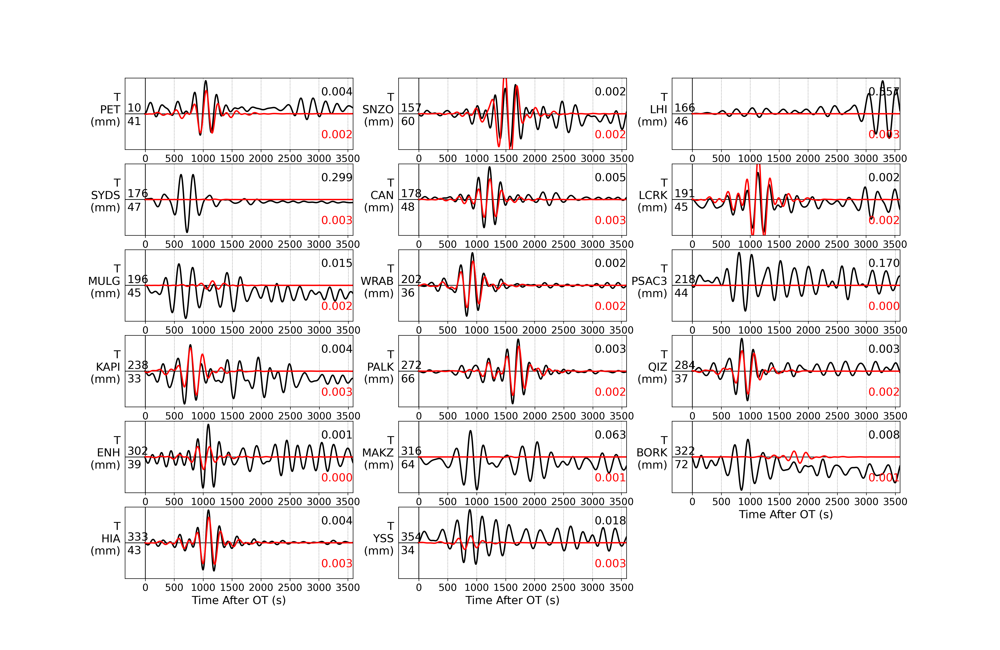

In [11]:
display(Image(os.path.join(B,'event_2023_mariana/20230814135153/ffm.0/NP1_shift/plots/Love_surf_waves.png')))


### Conjugate NP2 (0/66/−143), for comparison


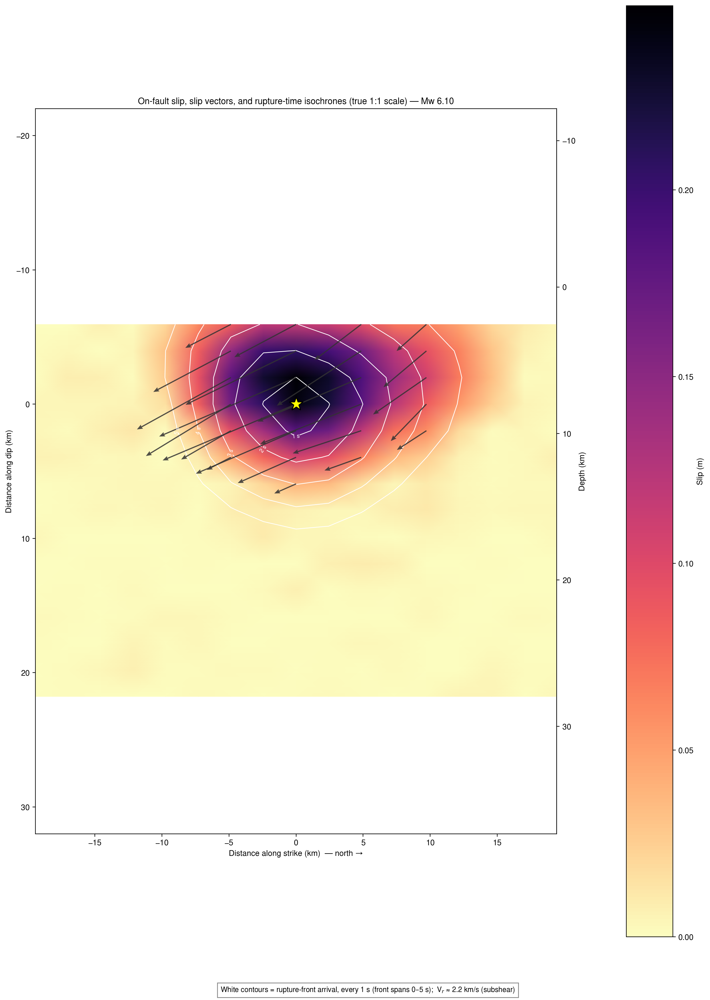

In [12]:
display(Image(os.path.join(B,'event_2023_mariana/20230814135153/ffm.0/NP2_shift/plots/SlipIsochrone_trueScale.png')))


## 4. Resolution assessment — what is and is not resolved
The verdict figure, then the metrics:


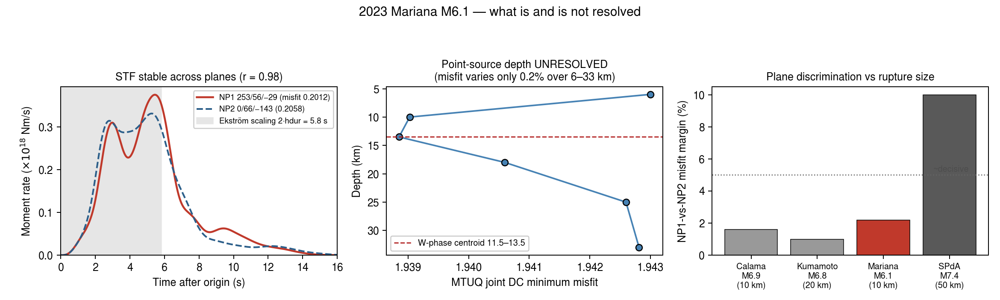

In [13]:
display(Image(os.path.join(B,'event_2023_mariana/fig_mariana_resolution.png')))


In [14]:
import numpy as np
E = os.path.join(B, 'event_2023_mariana/20230814135153/ffm.0')

def solution(P):
    txt = open(os.path.join(E, P, 'Solution.txt')).read().splitlines()
    i0 = next(i for i, l in enumerate(txt) if 'slip' in l and 'rake' in l) + 1
    return np.array([[float(x) for x in l.split()[:11]] for l in txt[i0:] if len(l.split()) >= 11])

A = solution('NP1_shift'); slip = A[:,3]/100.; dep = A[:,2]
dA = 2.426*1.98*1e6; M0 = 1.76e18
A_eff = dA*slip.sum()**2/(slip**2).sum(); a_eff = np.sqrt(A_eff/np.pi)
A_hm = dA*np.sum(slip > 0.5*slip.max()); a_hm = np.sqrt(A_hm/np.pi)
big = slip > 0.15*slip.max()
print(f"slip>15% peak depth range : {dep[big].min():.1f}-{dep[big].max():.1f} km")
print(f"effective area (Mai-Beroza-style (Σu)²/Σu²) : {A_eff/1e6:.0f} km² -> radius {a_eff/1e3:.1f} km -> Δσ = {7/16*M0/a_eff**3/1e6:.1f} MPa")
print(f"half-peak area : {A_hm/1e6:.0f} km² -> radius {a_hm/1e3:.1f} km -> Δσ = {7/16*M0/a_hm**3/1e6:.1f} MPa")
print(f"Ekström duration scaling 2·hdur = {2*2.4e-6*M0**(1/3):.1f} s (observed T5-95 8.2 s incl. regularization tail; rupture front spans 0-5 s)")


slip>15% peak depth range : 1.4-12.9 km
effective area (Mai-Beroza-style (Σu)²/Σu²) : 263 km² -> radius 9.2 km -> Δσ = 1.0 MPa
half-peak area : 110 km² -> radius 5.9 km -> Δσ = 3.7 MPa
Ekström duration scaling 2·hdur = 5.8 s (observed T5-95 8.2 s incl. regularization tail; rupture front spans 0-5 s)


**Resolved (feature agrees across both planes, passes physical checks):**
- a **single compact asperity ~10 km across** at 2–13 km depth, centred on the hypocentre — consistent with Mw 6.1 source scaling;
- the **STF shape including its two-pulse structure** (2.8 s + 5.4 s): cross-plane correlation r = 0.98, the plane-independent (therefore data-driven) part of the model;
- **M0 to 1%** of the W-phase; rupture front spanning 0–5 s (Vr ≈ 2.0 km/s, subshear);
- **stress drop 1.0–3.7 MPa** (effective-area vs half-peak-area conventions) — squarely in the physically expected 1–10 MPa range.

**Not resolved (and said so):**
- the **fault plane**: 2.2% misfit margin for NP1 is suggestive, not decisive, at this rupture size;
- an **independent point-source mechanism or centroid depth** (MTUQ fails at this magnitude — Section 2);
- **fine slip detail and the duration tail**: T5-95 = 8.2 s exceeds the ~5.8 s scaling expectation because smoothing regularization spreads low-level slip; treat the 25-cm peak as a lower bound and the tail as an artefact;
- **absolute updip/downdip placement** within the compact patch (teleseismic depth kernel is smooth at these wavelengths).

## 5. Verdict
**Yes — a reliable first-order finite-fault model is recoverable for an M6.1**, provided the Hartzell recipe is followed: fix the mechanism from the W-phase, keep P waves to 1 Hz, use km-scale subfaults, and claim only the plane-stable features (compact asperity geometry, STF shape, M0, stress drop). What cannot be claimed at this magnitude: the fault plane, an independent mechanism, or centroid depth from teleseismic point-source inversion alone. This extends the pipeline's validated range down from M6.8 to M6.1, one magnitude unit above the Hartzell et al. (2013) M5.8 benchmark.
